# Machine learning based apprpoach for achitecture detection from GitHub repositories

```
Author: Gcinizwe Dlamini
```
<hr>

```
The notebook is dedicated to data extraction, EDA and classisification

Main libraries used :     
- catboost
- pandas
- sklearn
- interpret
```

If catboost not installed run  `!pip install catboost`

## Extract data from files

In [231]:
import os, glob
import pandas as pd
import numpy as np 

import warnings
warnings.filterwarnings("ignore")
from platform import python_version
from sklearn.metrics import log_loss
import matplotlib.pyplot as plt

print(python_version())

3.10.9


In [232]:
def get_data_from_csv(train_path='../Data/train.csv', test_path='../Data/test.csv', print_stat=False):
    train_df = pd.read_csv(train_path)
    test_df = pd.read_csv(test_path)

    if print_stat:
        pass
    return train_df, test_df

In [233]:
train_df, test_df = get_data_from_csv()
mapping_labels = {"mvp":0,"mvvm":1}

train_df['label'] = train_df.label.apply(lambda x : mapping_labels.get(x))
test_df['label'] = test_df.label.apply(lambda x : mapping_labels.get(x))


Xtrain, ytrain = train_df.drop('label',axis=1).values, train_df.label.values
Xtest, ytest = test_df.drop('label',axis=1).values, test_df.label.values

In [234]:
# for c in train_df.columns:
#     n = c.replace('_', "\_")
#     t = r"""\small \textcolor{blue}{"""+n+r"""} & \small \textcolor{blue}{Fully  combining the resultsensuring}  \\\midrule"""
#     print(t)

## Print data distributions

In [235]:
print(f"xtrain : {len(Xtrain)}")
print(f"Xtest : {len(Xtest)}")

labels_map = {0:"mvp",1:"mvvm"}
val, count = np.unique(ytrain,return_counts=True)

print("---Train----")
for v,c in zip(val, count):
    print(f"{labels_map[v]} --> {c} [{c/len(ytrain)}]")

val, count = np.unique(ytest,return_counts=True)
print("---Test----")
for v,c in zip(val, count):
    print(f"{labels_map[v]} --> {c} [{c/len(ytest)}]")

xtrain : 4778
Xtest : 1195
---Train----
mvp --> 2011 [0.42088740058601926]
mvvm --> 2767 [0.5791125994139807]
---Test----
mvp --> 470 [0.39330543933054396]
mvvm --> 725 [0.606694560669456]


## Define, train and Evaluate ML models

In [236]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, accuracy_score
from interpret.glassbox import ExplainableBoostingClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import RocCurveDisplay

DecisionTreeClassifier
DecisionTreeClassifier Sensitivity= 0.7089655172413794
DecisionTreeClassifier Specificity= 0.6723404255319149
DecisionTree Log Loss 11.009149361529508
              precision    recall  f1-score   support

           0       0.60      0.67      0.63       470
           1       0.77      0.71      0.74       725

    accuracy                           0.69      1195
   macro avg       0.68      0.69      0.69      1195
weighted avg       0.70      0.69      0.70      1195

0.699 F1 with a standard deviation of 0.01 

RandomForestClassifier
RandomForestClassifier Sensitivity= 0.8510344827586207
RandomForestClassifier Specificity= 0.7404255319148936
RandomForestClassifier Log Loss 6.937272200415854
              precision    recall  f1-score   support

           0       0.76      0.74      0.75       470
           1       0.83      0.85      0.84       725

    accuracy                           0.81      1195
   macro avg       0.80      0.80      0.80      1195

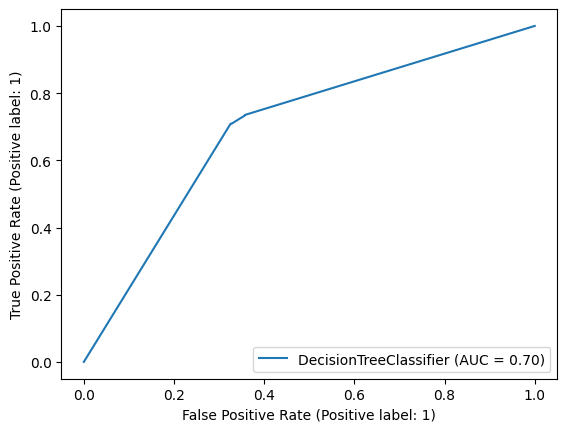

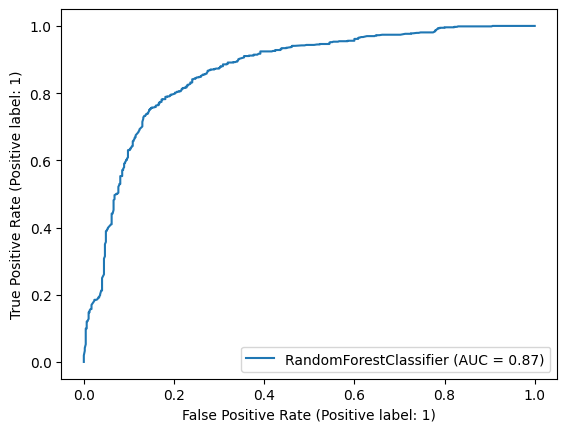

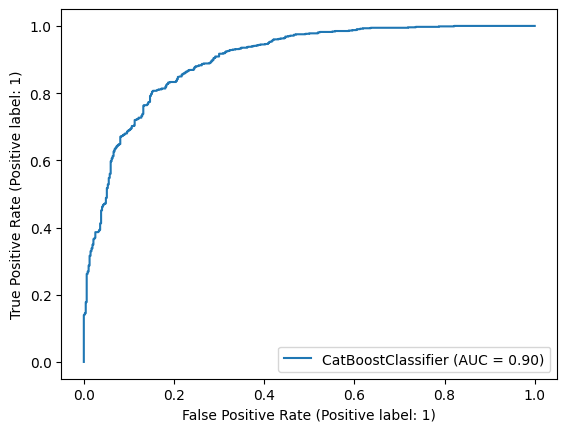

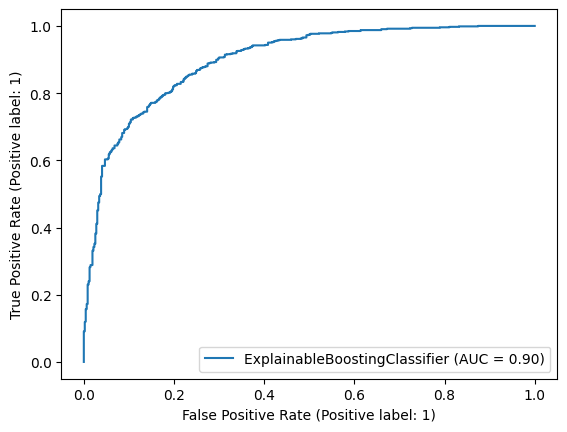

In [237]:
print("DecisionTreeClassifier")
dt = DecisionTreeClassifier()
dt.fit(Xtrain, ytrain)
ypred = dt.predict(Xtest)
cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"DecisionTreeClassifier Sensitivity=", sensitivity)
print(f"DecisionTreeClassifier Specificity=", specificity)
print(f"DecisionTree Log Loss", log_loss(ytest, ypred))
print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(dt, Xtest, ytest)

## Cross Validation 
dt = DecisionTreeClassifier()
scores = cross_val_score(dt, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))


print("RandomForestClassifier")
rf = RandomForestClassifier()
rf.fit(Xtrain, ytrain)
ypred = rf.predict(Xtest)

cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"RandomForestClassifier Sensitivity=", sensitivity)
print(f"RandomForestClassifier Specificity=", specificity)
print(f"RandomForestClassifier Log Loss", log_loss(ytest, ypred))

print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(rf, Xtest, ytest)

# feature importance from Random Forest
rf_feature_importance = pd.DataFrame({'feature_importance_rf': rf.feature_importances_, 
                                      'feature_names': train_df.columns[:-1]}).sort_values(by=['feature_importance_rf'], 
                                        ascending=False)

## Cross Validation 
rf = RandomForestClassifier()
scores = cross_val_score(rf, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))

print("CatBoostClassifier")
cb = CatBoostClassifier(verbose=False)
cb.fit(Xtrain, ytrain)
ypred = cb.predict(Xtest)

cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"CatBoostClassifier Sensitivity=", sensitivity)
print(f"CatBoostClassifier Specificity=", specificity)

print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(cb, Xtest, ytest)

# feature importance from CatBoost Classifier
print(cb.feature_importances_)
feature_importance = pd.DataFrame({'feature_importance_cb': cb.feature_importances_, 
                                      'feature_names': train_df.columns[:-1]}).sort_values(by=['feature_importance_cb'], 
                                        ascending=False)

## Cross Validation CatBoost Classifier
cb = CatBoostClassifier(verbose=False)
scores = cross_val_score(cb, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))

print("ExplainableBoostingClassifier")
ebm = ExplainableBoostingClassifier(random_state=1)
ebm.fit(train_df.drop('label',axis=1), ytrain)
pred = ebm.predict(test_df.drop('label',axis=1))

cm = confusion_matrix(ytest, pred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"ExplainableBoostingClassifier Sensitivity=", sensitivity)
print(f"ExplainableBoostingClassifier Specificity=", specificity)
print(classification_report(ytest, pred))
RocCurveDisplay.from_estimator(ebm, Xtest, ytest)

print(ebm.term_importances())
# feature importance from Explainable Boosting Classifier
ebm_feature_importance = pd.DataFrame({'feature_importance_ebm': ebm.term_importances(), 
                                      'feature_names': ebm.feature_names}).sort_values(by=['feature_importance_ebm'], 
                                        ascending=False)

## Cross Validation 
ebm = ExplainableBoostingClassifier(random_state=1)
scores = cross_val_score(ebm, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))

LogisticRegression
LogisticRegression Sensitivity= 0.8717241379310345
LogisticRegression Specificity= 0.7510638297872341
              precision    recall  f1-score   support

           0       0.79      0.75      0.77       470
           1       0.84      0.87      0.86       725

    accuracy                           0.82      1195
   macro avg       0.82      0.81      0.81      1195
weighted avg       0.82      0.82      0.82      1195

0.820 F1 with a standard deviation of 0.01 

neural network
NeuralNetwork Sensitivity= 0.886896551724138
NeuralNetwork Specificity= 0.7574468085106383
              precision    recall  f1-score   support

           0       0.81      0.76      0.78       470
           1       0.85      0.89      0.87       725

    accuracy                           0.84      1195
   macro avg       0.83      0.82      0.83      1195
weighted avg       0.84      0.84      0.83      1195

0.816 F1 with a standard deviation of 0.01 

KNN
KNN Sensitivity= 0.852413

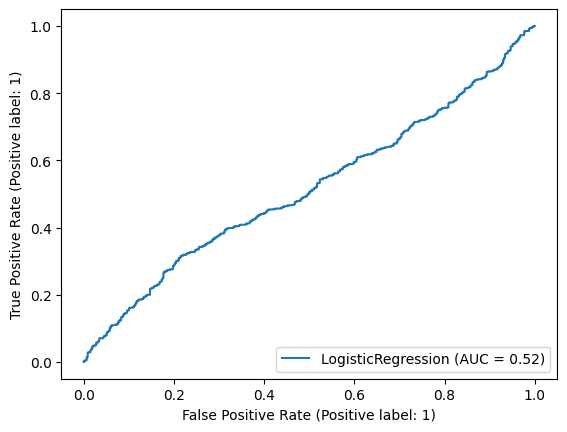

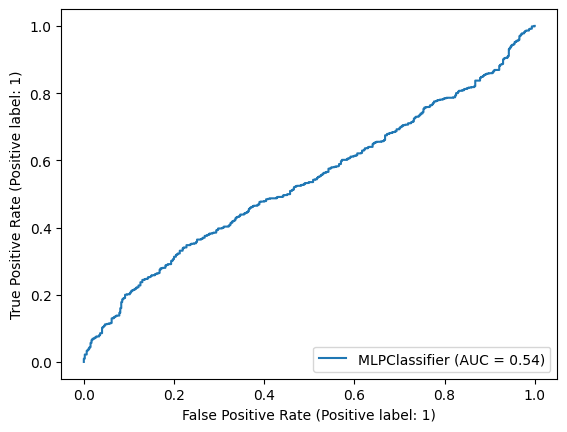

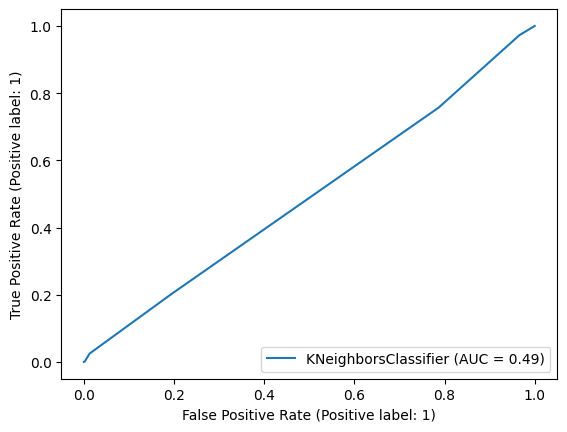

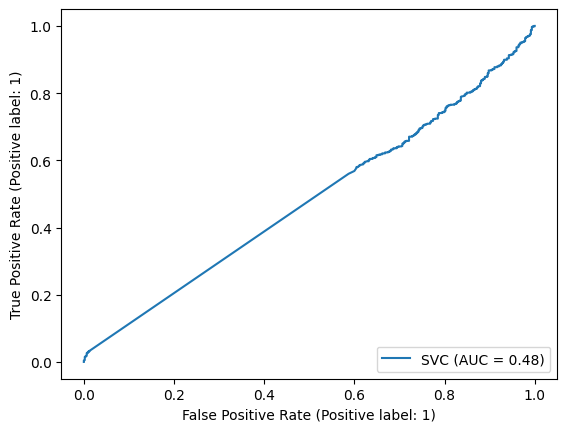

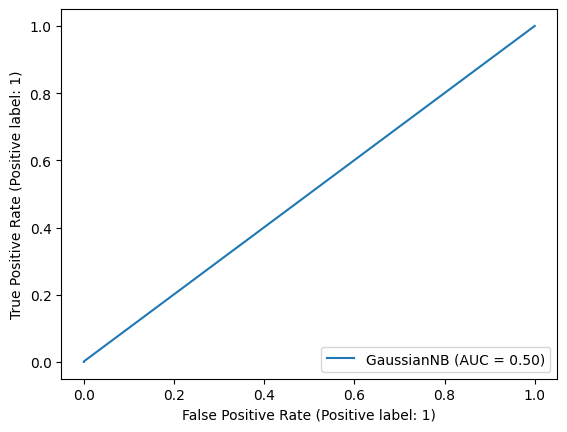

In [238]:
from sklearn.pipeline import make_pipeline
scaler = StandardScaler()
X_train_std = scaler.fit_transform(Xtrain)
X_test_std = scaler.transform(Xtest)

print("LogisticRegression")
lr = LogisticRegression()
lr.fit(X_train_std, ytrain)
ypred = lr.predict(X_test_std)
cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"LogisticRegression Sensitivity=", sensitivity)
print(f"LogisticRegression Specificity=", specificity)
print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(lr, Xtest, ytest)

## Cross Validation LR
clf = make_pipeline(StandardScaler(), LogisticRegression())
scores = cross_val_score(clf, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))


print("neural network")
from sklearn.neural_network import MLPClassifier
nn_clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)

nn_clf.fit(X_train_std, ytrain)
ypred = nn_clf.predict(X_test_std)
cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"NeuralNetwork Sensitivity=", sensitivity)
print(f"NeuralNetwork Specificity=", specificity)
print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(nn_clf, Xtest, ytest)

## Cross Validation nn
nn_clf = MLPClassifier(solver='lbfgs', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)
clf = make_pipeline(StandardScaler(), nn_clf)
scores = cross_val_score(clf, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))


print("KNN")
knn = KNeighborsClassifier()
knn.fit(X_train_std, ytrain)
ypred = knn.predict(X_test_std)
cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"KNN Sensitivity=", sensitivity)
print(f"KNN Specificity=", specificity)
print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(knn, Xtest, ytest)

## Cross Validation 
clf = make_pipeline(StandardScaler(), KNeighborsClassifier())
scores = cross_val_score(clf, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))

print("SVM")
svmclf = SVC()
svmclf.fit(X_train_std, ytrain)
ypred = svmclf.predict(X_test_std)
cm = confusion_matrix(ytest, ypred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"SVM Sensitivity=", sensitivity)
print(f"SVM Specificity=", specificity)
print(classification_report(ytest, ypred))
RocCurveDisplay.from_estimator(svmclf, Xtest, ytest)

## Cross Validation SVM
clf = make_pipeline(StandardScaler(), SVC())
scores = cross_val_score(clf, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))

print("GaussianNB")
gnb = GaussianNB()
y_pred = gnb.fit(X_train_std, ytrain).predict(X_test_std)
cm = confusion_matrix(ytest, y_pred)
TP = cm[1, 1]
FP = cm[0, 1]
TN = cm[0, 0]
FN = cm[1, 0]
sensitivity = TP / (TP + FN)
specificity = TN / (TN + FP)
print(f"GaussianNB Sensitivity=", sensitivity)
print(f"GaussianNB Specificity=", specificity)
print(classification_report(ytest, y_pred))
RocCurveDisplay.from_estimator(gnb, Xtest, ytest)

## Cross Validation NB
clf = make_pipeline(StandardScaler(), GaussianNB())
scores = cross_val_score(clf, Xtrain, ytrain, cv=5, scoring='f1_weighted')
print("%0.3f F1 with a standard deviation of %0.2f \n" % (scores.mean(), scores.std()))

## Get Feature importances

In [239]:
feature_importance = feature_importance.merge(ebm_feature_importance, on='feature_names')
feature_importance = feature_importance.merge(rf_feature_importance, on='feature_names')

feature_importance.set_index('feature_names', inplace=True)

### Print top 10 important features per Model

In [240]:
for c in feature_importance.columns:
    print(c)
    t = feature_importance.sort_values(by=[c], ascending=False).index[:10]
    print(list(t))

feature_importance_cb
[]
feature_importance_ebm
[]
feature_importance_rf
[]


In [241]:
feature_importance.sort_values(by=['feature_importance_cb','feature_importance_rf', 'feature_importance_ebm'], ascending=False, inplace=True)

## Overall ranking for features

In [242]:
feature_importance.head(10)

,feature_importance_cb,feature_importance_ebm,feature_importance_rf
feature_names,,,


In [243]:
feature_importance.tail(10)

,feature_importance_cb,feature_importance_ebm,feature_importance_rf
feature_names,,,


## Calculate Feature ranks

In [244]:
feature_ranks = pd.DataFrame(zip(feature_importance.sort_values(by=['feature_importance_rf'], ascending=False).index,np.arange(1,len(feature_importance)+1)),
             columns=['feature_names',f'R0'])
for j, c in enumerate(feature_importance.columns[:-1]): 
    t = pd.DataFrame(zip(feature_importance.sort_values(by=[c], ascending=False).index,np.arange(1,len(feature_importance)+1)),
             columns=['feature_names',f'R{j+1}'])
    feature_ranks = feature_ranks.merge(t, on='feature_names')

feature_ranks['overall'] = feature_ranks[['R0','R1','R2']].sum(1)
feature_ranks.sort_values(by='overall',inplace=True)

## Top 10 Features

In [245]:
feature_ranks.head(10)

,R0,R1,feature_names,R2,overall


## Bottom 10 Features

In [246]:
feature_ranks.tail(10)

,R0,R1,feature_names,R2,overall


## Explainable Boosting Machine
Bringing Explainable ML model

In [247]:
from interpret import set_visualize_provider
from interpret.provider import InlineProvider
set_visualize_provider(InlineProvider())

from interpret import show

In [248]:
ebm = ExplainableBoostingClassifier(random_state=1)
ebm.fit(train_df.drop('label',axis=1), ytrain)

ebm_global = ebm.explain_global()
show(ebm_global)

ebm_local = ebm.explain_local(test_df.drop('label',axis=1), ytest)
show(ebm_local)

## Shapley Additive Explanations
Explaining blackbox models

In [249]:
from interpret.blackbox import ShapKernel

blackbox_model = MLPClassifier(solver='lbfgs', alpha=1e-5,
                hidden_layer_sizes=(5, 2), random_state=1)

blackbox_model.fit(X_train_std, ytrain)

shap = ShapKernel(predict_fn=blackbox_model.predict_proba, data=X_train_std)
shap_local = shap.explain_local(X_test_std[:5], ytest[:5])

show(shap_local)

Using 4778 background data samples could cause slower run times. Consider using shap.sample(data, K) or shap.kmeans(data, K) to summarize the background as K samples.


  0%|          | 0/5 [00:00<?, ?it/s]